In [1]:
import os 
print(os.getcwd())

/home/sagemaker-user


In [2]:
!pip install -r requirements.txt -q

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
amazon-sagemaker-jupyter-ai-q-developer 1.2.7 requires onnxruntime<2,>=1.15.0, which is not installed.
autogluon-multimodal 1.4.0 requires nvidia-ml-py3<8.0,>=7.352.0, which is not installed.
amazon-sagemaker-jupyter-ai-q-developer 1.2.7 requires numpy<=2.0.1, but you have numpy 2.2.6 which is incompatible.
amazon-sagemaker-sql-magic 0.1.4 requires numpy<2, but you have numpy 2.2.6 which is incompatible.
autogluon-multimodal 1.4.0 requires transformers[sentencepiece]<4.50,>=4.38.0, but you have transformers 4.55.2 which is incompatible.
autogluon-timeseries 1.4.0 requires transformers[sentencepiece]<4.50,>=4.38.0, but you have transformers 4.55.2 which is incompatible.
gluonts 0.16.2 requires numpy<2.2,>=1.16, but you have numpy 2.2.6 which is incompatible.
langchain-aws 0.2.19 requires boto3>=1.37.24, but you hav

In [3]:
!sudo apt-get update -q && sudo apt-get install -y libgl1 -q

Get:1 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  InRelease [1581 B]
Hit:2 http://archive.ubuntu.com/ubuntu jammy InRelease
Get:3 http://archive.ubuntu.com/ubuntu jammy-updates InRelease [128 kB]
Get:4 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  Packages [2014 kB]
Get:5 http://security.ubuntu.com/ubuntu jammy-security InRelease [129 kB]
Get:6 http://archive.ubuntu.com/ubuntu jammy-backports InRelease [127 kB]
Get:7 http://archive.ubuntu.com/ubuntu jammy-updates/multiverse amd64 Packages [69.1 kB]
Get:8 http://archive.ubuntu.com/ubuntu jammy-updates/restricted amd64 Packages [5804 kB]
Get:9 http://archive.ubuntu.com/ubuntu jammy-updates/main amd64 Packages [3690 kB]
Get:10 http://archive.ubuntu.com/ubuntu jammy-updates/universe amd64 Packages [1577 kB]
Get:11 http://security.ubuntu.com/ubuntu jammy-security/main amd64 Packages [3371 kB]
Get:12 http://archive.ubuntu.com/ubuntu jammy-backports/universe amd64 Packages [35.2 kB

In [10]:
#manipolazione dati 
import cv2

import numpy as np 

#sistema
import os
import gc

#displaying a video 
from IPython.display import HTML,display, clear_output

#loading mat
from scipy.io import loadmat
import mat73


#visualizzazione
import matplotlib.pyplot as plt
from PIL import Image

#utility 
import re
from base64 import b64encode
from src.utils import utility_fun as uf

## ENV PATH VAR

In [11]:
#folder 
path_env_dict=uf.get_path_env()
DB_PATH = path_env_dict['UNIMI_DB_PATH']
FACIAL_MARKS= path_env_dict['FACIAL_MARKS_UNIMI']
RAW_VIDEO= path_env_dict['RAW_VIDEO']
FIX_DATA= path_env_dict['FIX_DATA']
FIX_DATA_NEW= path_env_dict['FIX_DATA_NEW']
FIX_DURATION_DATA = path_env_dict['FIX_DURATION_DATA_UNIMI']

#var for testing
VIDEO_ID='001'

In [12]:
RAW_FIX_DURATION_PATH = path_env_dict['RAW_FIX_DURATION_PATH']
len(os.listdir(RAW_FIX_DURATION_PATH))

66

## UTILITY FUN

In [ ]:
display_video(video_path=os.path.join(RAW_VIDEO,f'{VIDEO_ID}.mp4'),w=400)

In [52]:
import cv2

cap = cv2.VideoCapture(os.path.join(RAW_VIDEO,f'{VIDEO_ID}.mp4'))
num_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
fps = cap.get(cv2.CAP_PROP_FPS)
duration = num_frames / fps

print(f"Actual frame count: {num_frames}")
print(f"Duration (s): {duration:.2f}")

Actual frame count: 523
Duration (s): 20.92


#### EXPLORING fixation data (.mat)

In [6]:
def show_mat_data(mat_path): 
    mat_data = loadmat(mat_path)
    for key_ in mat_data: 
        print('*******')
        print('key==>', key_) 
        value_ = mat_data[key_] 
        print('type==>',type(value_))
        if isinstance(value_,np.ndarray):
            print('shape==>',value_.shape)
            print('first array value at [0,0]===>', (value_[0,0].shape))
            if key_ =='curr_v_all_s':
                for v in range(value_.shape[0]): 
                    value_detail = value_[v, 0].shape
                    print('value shape detail ==>', value_detail)
                    
        else: 
            print('value==>', value_) 

### check nan values per obs in any frame 

In [115]:
 mat_data = loadmat(os.path.join(FIX_DATA,f'{VIDEO_ID}.mat'))['fix_data']

In [116]:
import numpy as np 
n_frame = mat_data.shape[2] 
all_frame_nan_counter = 0 
frame_with_nan_values_counter=0

for obs_id in range(mat_data.shape[1]):  
    print('*******')
    print('obs id===>',obs_id)
    frame_nan_cnt = int(np.sum(np.isnan(mat_data[:,obs_id,:].flatten().reshape(-1))))
    if frame_nan_cnt>0: 
        print('something is nan for observer =>', obs_id) 
        frame_with_nan_values_counter+=1
        if frame_nan_cnt<n_frame:  
            print('a few frame has no fixation point. Frame with nan values==>',frame_nan_cnt)
        else:
            print('all frame are nan')
            all_frame_nan_counter+=1 
print('total obs',  mat_data.shape[1]) 
print('obs_with_nan_values', frame_with_nan_values_counter)
print('obs_with_ALL_nan_values', all_frame_nan_counter)
print('obs all frame ok',  mat_data.shape[1]-frame_with_nan_values_counter) 
print('obs some frame ok',  mat_data.shape[1]-all_frame_nan_counter) 

*******
obs id===> 0
*******
obs id===> 1
*******
obs id===> 2
*******
obs id===> 3
*******
obs id===> 4
*******
obs id===> 5
*******
obs id===> 6
*******
obs id===> 7
*******
obs id===> 8
*******
obs id===> 9
*******
obs id===> 10
*******
obs id===> 11
*******
obs id===> 12
*******
obs id===> 13
*******
obs id===> 14
*******
obs id===> 15
*******
obs id===> 16
*******
obs id===> 17
*******
obs id===> 18
*******
obs id===> 19
*******
obs id===> 20
*******
obs id===> 21
*******
obs id===> 22
*******
obs id===> 23
*******
obs id===> 24
*******
obs id===> 25
*******
obs id===> 26
*******
obs id===> 27
*******
obs id===> 28
something is nan for observer => 28
a few frame has no fixation point. Frame with nan values==> 2
*******
obs id===> 29
something is nan for observer => 29
a few frame has no fixation point. Frame with nan values==> 18
*******
obs id===> 30
something is nan for observer => 30
a few frame has no fixation point. Frame with nan values==> 28
*******
obs id===> 31
something 

### exploring data structure quickly 

In [113]:
#show 'Our_database/fix_duratons.mat')
show_mat_data(mat_path=os.path.join(DB_PATH,'fix_duratons.mat'))
#show 'Our_database/fix_data/video_id.mat')
show_mat_data(mat_path=os.path.join(FIX_DATA,f'{VIDEO_ID}.mat'))
#show 'Our_database/fix_data_NEW/video_id.mat')
show_mat_data(mat_path=os.path.join(FIX_DATA_NEW,f'{VIDEO_ID}.mat'))
#show 'Our_database/fix_and_dur_data/video_id.mat')
show_mat_data(mat_path=os.path.join(FIX_DURATION_DATA,f'{int(VIDEO_ID)}.mat'))

*******
key==> __header__
type==> <class 'bytes'>
value==> b'MATLAB 5.0 MAT-file, Platform: GLNXA64, Created on: Mon Jan 28 16:57:03 2019'
*******
key==> __version__
type==> <class 'str'>
value==> 1.0
*******
key==> __globals__
type==> <class 'list'>
value==> []
*******
key==> fix_dur
type==> <class 'numpy.ndarray'>
shape==> (145889, 1)
first array value at [0,0]===> ()
*******
key==> __header__
type==> <class 'bytes'>
value==> b'MATLAB 5.0 MAT-file, Platform: PCWIN64, Created on: Tue Jan 22 12:32:41 2019'
*******
key==> __version__
type==> <class 'str'>
value==> 1.0
*******
key==> __globals__
type==> <class 'list'>
value==> []
*******
key==> fix_data
type==> <class 'numpy.ndarray'>
shape==> (2, 70, 523)
first array value at [0,0]===> (523,)
*******
key==> __header__
type==> <class 'bytes'>
value==> b'MATLAB 5.0 MAT-file, Platform: GLNXA64, Created on: Mon Sep  9 11:12:44 2019'
*******
key==> __version__
type==> <class 'str'>
value==> 1.0
*******
key==> __globals__
type==> <class 'list

### max observer (non null) per video in new data fixation 

In [139]:
total_video_cnt=75
total_obs_l =[]
for video_idx in range(total_video_cnt):
    VIDEO_ID =str(video_idx+1).zfill(3) 
    try:
        mat_data_fix_new = loadmat(os.path.join(FIX_DATA_NEW,f'{VIDEO_ID}.mat'))
        max_observer_cnt = mat_data_fix_new['curr_v_all_s'].shape[0]
        #print('max obs per video', {VIDEO_ID},'==>',max_observer_cnt,'/ 70')
        total_obs_l.append(max_observer_cnt)
    except Exception as e:  
        print('issue',e,'for video with id', video_idx)
print(np.mean(total_obs_l),np.min(total_obs_l),np.max(total_obs_l),np.median(total_obs_l))

issue [Errno 2] No such file or directory: 'find_dataset/Our_database/fix_data_NEW/017.mat' for video with id 16
issue [Errno 2] No such file or directory: 'find_dataset/Our_database/fix_data_NEW/029.mat' for video with id 28
issue [Errno 2] No such file or directory: 'find_dataset/Our_database/fix_data_NEW/032.mat' for video with id 31
issue [Errno 2] No such file or directory: 'find_dataset/Our_database/fix_data_NEW/039.mat' for video with id 38
issue [Errno 2] No such file or directory: 'find_dataset/Our_database/fix_data_NEW/041.mat' for video with id 40
issue [Errno 2] No such file or directory: 'find_dataset/Our_database/fix_data_NEW/046.mat' for video with id 45
issue [Errno 2] No such file or directory: 'find_dataset/Our_database/fix_data_NEW/051.mat' for video with id 50
issue [Errno 2] No such file or directory: 'find_dataset/Our_database/fix_data_NEW/052.mat' for video with id 51
issue [Errno 2] No such file or directory: 'find_dataset/Our_database/fix_data_NEW/055.mat' for 

### check fixation points changes over frames for the same observer


In [9]:
VIDEO_ID='011'
mat_data_fix_dur = loadmat(os.path.join(FIX_DURATION_DATA,f'{int(VIDEO_ID)}.mat'))
mat_data_fix_new = loadmat(os.path.join(FIX_DATA_NEW,f'{VIDEO_ID}.mat'))

frame_idx=0
fixed_idx=0
ob_idx = 0
total_frame = 0
#frame count using new data points. Remember: [obs x1]=>[frame cnt x 2]
frame_cnt0 = mat_data_fix_new['curr_v_all_s'][ob_idx,0].shape[0]

frame_cnt1 = mat_data_fix_dur['curr_v_all_s'][ob_idx,0].shape[0]
frame_cnt2=mat_data_fix_dur['curr_v_all_s'][:,0][ob_idx].shape[0]
mat_data_fix_new['curr_v_all_s'][2,0].shape
print('frame_count0',frame_cnt0,'frame_count1', frame_cnt1,'frame_cnt2',frame_cnt2)
print('*** DATA FIX (OLD OR NEW??) + duration ***obs=>',ob_idx, '[x,y]=>', mat_data_fix_dur['curr_v_all_s'][:,fixed_idx][ob_idx][frame_idx,:])
mat_data_fix_dur['curr_v_all_s'][ob_idx,0][frame_idx,:]

frame_count0 523 frame_count1 65 frame_cnt2 65
*** DATA FIX (OLD OR NEW??) + duration ***obs=> 0 [x,y]=> [406 348 216]


array([406, 348, 216], dtype=uint16)

In [61]:
mat_data_fix_new['curr_v_all_s'][0,0][:,0]

array([ 406,  406,  406,  406,  406,  406,  626,  626,  626,  626,  626,
        626,  626,  626,  312,  312,  312,  312,  237,  237,  237,  237,
        237,  237,  237,  237,  237,  237,  237,  252,  252,  252,  252,
        252,  252,  252,  252,  624,  624,  624,  624,  624,  624,  624,
        806,  806,  806,  806,  840,  840,  840,  840,  840,  840,  840,
        840,  840,  840,  840,  840,  840,  840,  840,  220,  220,  220,
        220,  246,  246,  246,  246,  246,  246,  246,  246,  246,  246,
        246,  246,  246,  246,  246,  246,  246,  246,  246,  246,  487,
        487,  487,  487,  487,  487,  607,  607,  607,  607,  607,  607,
        607,  700,  700,  700,  700,  700,  700,  700,  782,  782,  782,
        782,  782,  559,  559,  559,  559,  559,  641,  641,  641,  641,
        434,  434,  434,  434,  434,  267,  267,  267,  267,  267,  267,
        267,  267,  267,  267,  267,  267,  267,  267,  267,  272,  272,
        272,  272,  272,  272,  272,  272,  280,  2

In [19]:
mat_data_fix_dur['curr_v_all_s'][ob_idx,0]

array([[ 406,  348,  216],
       [ 626,  334,  266],
       [ 312,  369,  133],
       [ 237,  371,  416],
       [ 252,  340,  266],
       [ 624,  313,  250],
       [ 806,  325,  150],
       [ 840,  319,  533],
       [ 220,  349,  150],
       [ 246,  366,  783],
       [ 487,  527,  217],
       [ 607,  547,  233],
       [ 700,  553,  250],
       [ 782,  567,  183],
       [ 559,  569,  183],
       [ 641,  551,  117],
       [ 434,  554,  167],
       [ 267,  370,  566],
       [ 272,  345,  316],
       [ 280,  365,  316],
       [ 279,  387,  217],
       [ 395,  567,  183],
       [ 434,  586,  166],
       [ 300,  418,  117],
       [ 285,  395,  266],
       [ 633,  331,  233],
       [ 652,  300,  233],
       [ 645,  347,  233],
       [ 653,  308,  450],
       [ 628,  306,  366],
       [ 911,  334, 1133],
       [ 304,  368,  883],
       [ 314,  395,  350],
       [ 461,  584,  200],
       [ 297,  367,  933],
       [ 287,  334,  300],
       [ 306,  320,  117],
 

In [71]:
mat_data_fix_new['curr_v_all_s'][0,0].shape

(523, 2)

In [27]:
mat_data_fix_dur['curr_v_all_s'][0]

array([array([[ 406,  348,  216],
              [ 626,  334,  266],
              [ 312,  369,  133],
              [ 237,  371,  416],
              [ 252,  340,  266],
              [ 624,  313,  250],
              [ 806,  325,  150],
              [ 840,  319,  533],
              [ 220,  349,  150],
              [ 246,  366,  783],
              [ 487,  527,  217],
              [ 607,  547,  233],
              [ 700,  553,  250],
              [ 782,  567,  183],
              [ 559,  569,  183],
              [ 641,  551,  117],
              [ 434,  554,  167],
              [ 267,  370,  566],
              [ 272,  345,  316],
              [ 280,  365,  316],
              [ 279,  387,  217],
              [ 395,  567,  183],
              [ 434,  586,  166],
              [ 300,  418,  117],
              [ 285,  395,  266],
              [ 633,  331,  233],
              [ 652,  300,  233],
              [ 645,  347,  233],
              [ 653,  308,  450],
              

In [64]:
mat_data_fix_old['fix_data'][0,ob_idx,:].shape

(523,)

In [42]:
mat_data_fix_old['fix_data'][0,ob_idx,frame_idx]

np.float64(nan)

In [54]:
mat_data_fix_old['fix_data'][0,ob_idx,:]

array([ 406.,  406.,  406.,  406.,  406.,  406.,  626.,  626.,  626.,
        626.,  626.,  626.,  626.,  312.,  312.,  312.,  312.,  312.,
        237.,  237.,  237.,  237.,  237.,  237.,  237.,  237.,  237.,
        237.,  252.,  252.,  252.,  252.,  252.,  252.,  252.,  252.,
        624.,  624.,  624.,  624.,  624.,  624.,  624.,  806.,  806.,
        806.,  806.,  806.,  840.,  840.,  840.,  840.,  840.,  840.,
        840.,  840.,  840.,  840.,  840.,  840.,  840.,  840.,  220.,
        220.,  220.,  220.,  220.,  246.,  246.,  246.,  246.,  246.,
        246.,  246.,  246.,  246.,  246.,  246.,  246.,  246.,  246.,
        246.,  246.,  246.,  246.,  246.,  246.,  487.,  487.,  487.,
        487.,  487.,  487.,  607.,  607.,  607.,  607.,  607.,  607.,
        607.,  700.,  700.,  700.,  700.,  700.,  700.,  700.,  782.,
        782.,  782.,  782.,  782.,  559.,  559.,  559.,  559.,  559.,
        559.,  641.,  641.,  641.,  434.,  434.,  434.,  434.,  434.,
        267.,  267.,

In [26]:
523/25

20.92

In [56]:
25*22

550

In [48]:
ob_idx

38

In [63]:


#[:,fixed_idx][ob_idx][frame_idx,:])

array([[992, 421],
       [992, 421],
       [992, 421],
       ...,
       [648, 257],
       [593, 257],
       [909, 514]], shape=(523, 2), dtype=uint16)

### comparison OLD VS NEW data fixation wrt the same observer

In [16]:
VIDEO_ID='011'
mat_data_fix_dur_glob = loadmat(os.path.join(DB_PATH,'fix_duratons.mat'))
mat_data_fix_new = loadmat(os.path.join(FIX_DATA_NEW,f'{VIDEO_ID}.mat'))
mat_data_fix_old = loadmat(os.path.join(FIX_DATA,f'{VIDEO_ID}.mat'))
mat_data_fix_dur = loadmat(os.path.join(FIX_DURATION_DATA,f'{int(VIDEO_ID)}.mat'))

In [20]:
mat_data_fix_dur_glob['fix_dur']

array([[349],
       [183],
       [250],
       ...,
       [233],
       [366],
       [466]], shape=(145889, 1), dtype=uint16)

In [14]:
mat_data_fix_new['curr_v_all_s'].shape

(39, 1)

In [41]:
mat_data_fix_dur['curr_v_all_s'][0,0][0,:]

array([406, 348, 216], dtype=uint16)

In [45]:
frame_idx=0
fixed_idx=0
observer_id = 0
max_observer_cnt = mat_data_fix_new['curr_v_all_s'].shape[0]
print('max obs per video', {VIDEO_ID},'==>',max_observer_cnt,'/ 70')

for ob_idx in range(max_observer_cnt):
    max_frame_in_fix_dur = mat_data_fix_dur['curr_v_all_s'][ob_idx,0].shape[0]
    if max_frame_in_fix_dur-1<frame_idx: 
        print('***frame idx not possible for obs idx=>',ob_idx) 
        continue
    print('*** DATA FIX NEW ***obs=>',ob_idx,'[x,y]=>',mat_data_fix_new['curr_v_all_s'][:,fixed_idx][ob_idx][frame_idx,:])
    print('*** DATA FIX OLD ***obs=>',ob_idx, '[x,y]=>', mat_data_fix_old['fix_data'][0,ob_idx,frame_idx],mat_data_fix_old['fix_data'][1,ob_idx,frame_idx])
    
    print('*** DATA FIX (OLD OR NEW??) + duration ***obs=>',ob_idx, '[x,y]=>', mat_data_fix_dur['curr_v_all_s'][ob_idx,0][frame_idx,:])
#['fix_data'][0,:,:3]

max obs per video {'011'} ==> 39 / 70
*** DATA FIX NEW ***obs=> 0 [x,y]=> [406 348]
*** DATA FIX OLD ***obs=> 0 [x,y]=> 406.0 348.0
*** DATA FIX (OLD OR NEW??) + duration ***obs=> 0 [x,y]=> [406 348 216]
*** DATA FIX NEW ***obs=> 1 [x,y]=> [647 304]
*** DATA FIX OLD ***obs=> 1 [x,y]=> 647.0 304.0
*** DATA FIX (OLD OR NEW??) + duration ***obs=> 1 [x,y]=> [647 304 150]
*** DATA FIX NEW ***obs=> 2 [x,y]=> [992 421]
*** DATA FIX OLD ***obs=> 2 [x,y]=> 992.0 421.0
*** DATA FIX (OLD OR NEW??) + duration ***obs=> 2 [x,y]=> [992 421 183]
*** DATA FIX NEW ***obs=> 3 [x,y]=> [694 421]
*** DATA FIX OLD ***obs=> 3 [x,y]=> 694.0 421.0
*** DATA FIX (OLD OR NEW??) + duration ***obs=> 3 [x,y]=> [694 421 650]
*** DATA FIX NEW ***obs=> 4 [x,y]=> [779 269]
*** DATA FIX OLD ***obs=> 4 [x,y]=> 779.0 269.0
*** DATA FIX (OLD OR NEW??) + duration ***obs=> 4 [x,y]=> [779 269 300]
*** DATA FIX NEW ***obs=> 5 [x,y]=> [701 386]
*** DATA FIX OLD ***obs=> 5 [x,y]=> 701.0 386.0
*** DATA FIX (OLD OR NEW??) + duration

## explore duration dataset 

In [48]:

mat_file_path = os.path.join(FACIAL_MARKS,f'final{int(VIDEO_ID)}.mat')

Keys: ['#refs#', 'final']
<HDF5 dataset "final": shape (1, 493), type "|O">


In [76]:
VIDEO_ID='002'
mat_data_fix_dur_glob,_ = load_mat_data(os.path.join(DB_PATH,'fix_duratons.mat'))
mat_facial_marks,_ = load_mat_data(os.path.join(FACIAL_MARKS,f'final{int(VIDEO_ID)}.mat')) 
mat_data_fix_new,_ = load_mat_data(os.path.join(FIX_DATA_NEW,f'{VIDEO_ID}.mat'))
mat_data_fix_old,_ = load_mat_data(os.path.join(FIX_DATA,f'{VIDEO_ID}.mat'))
mat_data_fix_dur,_ = load_mat_data(os.path.join(FIX_DURATION_DATA,f'{int(VIDEO_ID)}.mat'))

****reading new mat data
reading mat success!********
****reading new mat data
cannot read using loadmat fun Please use HDF reader for matlab v7.3 files, e.g. h5py
trying to use mat73...
reading mat success!********
****reading new mat data
reading mat success!********
****reading new mat data
reading mat success!********
****reading new mat data
reading mat success!********


In [10]:
#calculate next frame 
cap = cv2.VideoCapture(os.path.join(RAW_VIDEO,f'{VIDEO_ID}.mp4'))
num_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
fps = cap.get(cv2.CAP_PROP_FPS)
duration = num_frames / fps 
print('duration total in seconds==>',duration)
print('frame duration 0 ==>', duration/num_frames*1000)
frame_duration = int(np.ceil(1000/fps))
print('frame duration in ms =>',frame_duration)
ob_idx=0
mat_data_fix_dur['curr_v_all_s'][ob_idx,0][:,2].sum()/1000 +frame_duration/1000

duration total in seconds==> 20.92
frame duration 0 ==> 40.0
frame duration in ms => 40


np.float64(19.691)

## estimate actual number of frame according to the duration

In [92]:
import numpy as np 

In [93]:
ob_idx = 0
#expected frame count according to the old fixation data 
expected_frame_count=mat_data_fix_old['fix_data'][0,ob_idx,:].shape[0]
print('old fix: frame count==>',expected_frame_count)
#[2 x obs x frame]
point_f0_x_old = int(mat_data_fix_old['fix_data'][0,ob_idx,0])
point_f0_y_old = int(mat_data_fix_old['fix_data'][1,ob_idx,0])
point_f0 = (point_f0_x_old,point_f0_y_old)  
#[obs x 1][frame x 3]
point_f0_x_dur = int(mat_data_fix_dur['curr_v_all_s'][ob_idx,0][0,0])
point_f0_y_dur = int(mat_data_fix_dur['curr_v_all_s'][ob_idx,0][0,1])
point_f0_dur = (point_f0_x_old,point_f0_y_old)  
duration_f0= int(mat_data_fix_dur['curr_v_all_s'][ob_idx,0][0,2])
print('point f0 old=>',point_f0)
print('point f0 dur=>',point_f0_dur, 'with duration', duration_f0)
#calculate next frame 
cap = cv2.VideoCapture(os.path.join(RAW_VIDEO,f'{VIDEO_ID}.mp4'))
num_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
fps = cap.get(cv2.CAP_PROP_FPS)
duration = num_frames / fps 
print('duration total in seconds==>',duration)
print('frame duration 0 ==>', duration/num_frames*1000)
frame_duration = int(np.ceil(1000/fps))
print('frame duration in ms =>',frame_duration)

next_point = point_f0  
next_duration_point = point_f0_dur 
next_duration = duration_f0
data_duration_pos = 0  
frame_pos = 0 
print('duration f0==>',next_duration, 'while in frame count==>',(next_duration/frame_duration))
print('*****starting calculating****\n')
while frame_pos<expected_frame_count: 
    print('#########')
    print('frame pos==>', frame_pos,'/',expected_frame_count)
    spanned_frame_cnt = int(np.ceil(((next_duration/frame_duration))))
    print('spanned frame count==>',spanned_frame_cnt, 'from the current frame id=>',frame_pos)
    
    x_old_prev = int(mat_data_fix_old['fix_data'][0,ob_idx,frame_pos])
    y_old_prev = int(mat_data_fix_old['fix_data'][1,ob_idx,frame_pos])
    frame_pos = frame_pos +spanned_frame_cnt
    data_duration_pos+=1
    
    x_old = int(mat_data_fix_old['fix_data'][0,ob_idx,frame_pos])
    y_old = int(mat_data_fix_old['fix_data'][1,ob_idx,frame_pos])
    
    x_dur = int(mat_data_fix_dur['curr_v_all_s'][ob_idx,0][data_duration_pos-1,0])
    y_dur = int(mat_data_fix_dur['curr_v_all_s'][ob_idx,0][data_duration_pos-1,1])
    duration = (mat_data_fix_dur['curr_v_all_s'][ob_idx,0][data_duration_pos,2])
    print('next duration in ms', duration,'while in frames=>', duration/frame_duration)
    print(f'PREV old(x,y) at frame id', frame_pos-spanned_frame_cnt,f'==>[ {x_old_prev,y_old_prev} ]')
    print(f'old(x,y) at frame id', frame_pos,f'==>[ {x_old,y_old} ]')
    print(f'dur data(x,y) at frame id', frame_pos,f'==>[ {x_dur,y_dur} ] with real idx=>', data_duration_pos-1)
    
    next_duration= duration
    
    

old fix: frame count==> 523
point f0 old=> (406, 348)
point f0 dur=> (406, 348) with duration 216
duration total in seconds==> 20.92
frame duration 0 ==> 40.0
frame duration in ms => 40
duration f0==> 216 while in frame count==> 5.4
*****starting calculating****

#########
frame pos==> 0 / 523
spanned frame count==> 6 from the current frame id=> 0
next duration in ms 266 while in frames=> 6.65
PREV old(x,y) at frame id 0 ==>[ (406, 348) ]
old(x,y) at frame id 6 ==>[ (626, 334) ]
dur data(x,y) at frame id 6 ==>[ (406, 348) ] with real idx=> 0
#########
frame pos==> 6 / 523
spanned frame count==> 7 from the current frame id=> 6
next duration in ms 133 while in frames=> 3.325
PREV old(x,y) at frame id 6 ==>[ (626, 334) ]
old(x,y) at frame id 13 ==>[ (312, 369) ]
dur data(x,y) at frame id 13 ==>[ (626, 334) ] with real idx=> 1
#########
frame pos==> 13 / 523
spanned frame count==> 4 from the current frame id=> 13
next duration in ms 416 while in frames=> 10.4
PREV old(x,y) at frame id 13 =

IndexError: index 65 is out of bounds for axis 0 with size 65

In [55]:
num_frames

523

In [ ]:
mat_data_fix_dur['curr_v_all_s'][ob_idx,0][frame_idx,:]

In [ ]:
####using round 
#########
frame pos==> 313 / 523
spanned frame count==> 15 from the current frame id=> 313
next duration in ms 300 while in frames=> 7.5
PREV old(x,y) at frame id 313 ==>[ (297, 367) ]
old(x,y) at frame id 328 ==>[ (287, 334) ]
dur data(x,y) at frame id 328 ==>[ (628, 291) ] with real idx=> 38
#########
frame pos==> 328 / 523
spanned frame count==> 8 from the current frame id=> 328
next duration in ms 133 while in frames=> 3.325
PREV old(x,y) at frame id 328 ==>[ (287, 334) ]
old(x,y) at frame id 336 ==>[ (642, 340) ]
dur data(x,y) at frame id 336 ==>[ (606, 277) ] with real idx=> 39
#########
frame pos==> 336 / 523
spanned frame count==> 3 from the current frame id=> 336
next duration in ms 250 while in frames=> 6.25
PREV old(x,y) at frame id 336 ==>[ (642, 340) ]
old(x,y) at frame id 339 ==>[ (642, 340) ]
dur data(x,y) at frame id 339 ==>[ (900, 302) ] with real idx=> 40
#########
frame pos==> 339 / 523
spanned frame count==> 6 from the current frame id=> 339
next duration in ms 117 while in frames=> 2.925
PREV old(x,y) at frame id 339 ==>[ (642, 340) ]
old(x,y) at frame id 345 ==>[ (628, 291) ]
dur data(x,y) at frame id 345 ==>[ (934, 303) ] with real idx=> 41
#########
frame pos==> 345 / 523
spanned frame count==> 3 from the current frame id=> 345
next duration in ms 1199 while in frames=> 29.975
PREV old(x,y) at frame id 345 ==>[ (628, 291) ]
old(x,y) at frame id 348 ==>[ (628, 291) ]
dur data(x,y) at frame id 348 ==>[ (348, 329) ] with real idx=> 42
#########
frame pos==> 348 / 523
spanned frame count==> 30 from the current frame id=> 348
next duration in ms 133 while in frames=> 3.325
PREV old(x,y) at frame id 348 ==>[ (628, 291) ]
old(x,y) at frame id 378 ==>[ (934, 303) ]
dur data(x,y) at frame id 378 ==>[ (293, 342) ] with real idx=> 43

In [ ]:
######### using ceil
frame pos==> 319 / 523
spanned frame count==> 10 from the current frame id=> 319
next duration in ms 616 while in frames=> 15.4
PREV old(x,y) at frame id 319 ==>[ (297, 367) ]
old(x,y) at frame id 329 ==>[ (306, 320) ]
dur data(x,y) at frame id 329 ==>[ (642, 340) ] with real idx=> 37
#########
frame pos==> 329 / 523
spanned frame count==> 16 from the current frame id=> 329
next duration in ms 300 while in frames=> 7.5
PREV old(x,y) at frame id 329 ==>[ (306, 320) ]
old(x,y) at frame id 345 ==>[ (628, 291) ]
dur data(x,y) at frame id 345 ==>[ (628, 291) ] with real idx=> 38
#########
frame pos==> 345 / 523
spanned frame count==> 8 from the current frame id=> 345
next duration in ms 133 while in frames=> 3.325
PREV old(x,y) at frame id 345 ==>[ (628, 291) ]
old(x,y) at frame id 353 ==>[ (628, 291) ]
dur data(x,y) at frame id 353 ==>[ (606, 277) ] with real idx=> 39
#########
frame pos==> 353 / 523
spanned frame count==> 4 from the current frame id=> 353
next duration in ms 250 while in frames=> 6.25
PREV old(x,y) at frame id 353 ==>[ (628, 291) ]
old(x,y) at frame id 357 ==>[ (628, 291) ]
dur data(x,y) at frame id 357 ==>[ (900, 302) ] with real idx=> 40

In [ ]:
######using int 
#########
frame pos==> 314 / 523
spanned frame count==> 3 from the current frame id=> 314
next duration in ms 250 while in frames=> 6.25
PREV old(x,y) at frame id 314 ==>[ (297, 367) ]
old(x,y) at frame id 317 ==>[ (297, 367) ]
dur data(x,y) at frame id 317 ==>[ (900, 302) ] with real idx=> 40
#########
frame pos==> 317 / 523
spanned frame count==> 6 from the current frame id=> 317
next duration in ms 117 while in frames=> 2.925
PREV old(x,y) at frame id 317 ==>[ (297, 367) ]
old(x,y) at frame id 323 ==>[ (287, 334) ]
dur data(x,y) at frame id 323 ==>[ (934, 303) ] with real idx=> 41
#########
frame pos==> 323 / 523
spanned frame count==> 2 from the current frame id=> 323
next duration in ms 1199 while in frames=> 29.975
PREV old(x,y) at frame id 323 ==>[ (287, 334) ]
old(x,y) at frame id 325 ==>[ (287, 334) ]
dur data(x,y) at frame id 325 ==>[ (348, 329) ] with real idx=> 42
#########
frame pos==> 325 / 523
spanned frame count==> 29 from the current frame id=> 325
next duration in ms 133 while in frames=> 3.325
PREV old(x,y) at frame id 325 ==>[ (287, 334) ]
old(x,y) at frame id 354 ==>[ (628, 291) ]
dur data(x,y) at frame id 354 ==>[ (293, 342) ] with real idx=> 43

In [103]:
frame_duration_ms = 1000 / fps
frame_pos = 0
data_duration_pos = 0
fixation_map = []  # To store mapping: (duration_idx → frame_start, frame_end)
fixations = mat_data_fix_dur['curr_v_all_s'][ob_idx, 0]
num_fixations = fixations.shape[0]

for i in range(num_fixations):
    x_dur = int(fixations[i, 0])
    y_dur = int(fixations[i, 1])
    duration_ms = float(fixations[i, 2])
    
    span_frames = np.round(duration_ms / frame_duration_ms)
    start_frame = frame_pos
    end_frame = min(int(np.round(start_frame + span_frames)), expected_frame_count - 1)
    
    # Store mapping
    fixation_map.append({
        'duration_idx': i,
        'start_frame': start_frame,
        'end_frame': end_frame,
        'x': x_dur,
        'y': y_dur
    })
    
    # Advance frame position
    frame_pos = end_frame + 1
matched_cnt=0 
mismatch_cnt=0
for entry in fixation_map:
    for f in range(entry['start_frame'], entry['end_frame'] + 1):
        x_old = int(mat_data_fix_old['fix_data'][0, ob_idx, f])
        y_old = int(mat_data_fix_old['fix_data'][1, ob_idx, f])
        
        if (x_old, y_old) == (entry['x'], entry['y']):
            print(f"Match at frame {f} for fixation {entry['duration_idx']}")
            matched_cnt+=1
        else:
            print(f"Mismatch at frame {f}: expected ({entry['x']}, {entry['y']}), got ({x_old}, {y_old})")
            mismatch_cnt+=1
print('macthed=>',matched_cnt,'error=>',mismatch_cnt)

Match at frame 0 for fixation 0
Match at frame 1 for fixation 0
Match at frame 2 for fixation 0
Match at frame 3 for fixation 0
Match at frame 4 for fixation 0
Match at frame 5 for fixation 0
Match at frame 6 for fixation 1
Match at frame 7 for fixation 1
Match at frame 8 for fixation 1
Match at frame 9 for fixation 1
Match at frame 10 for fixation 1
Match at frame 11 for fixation 1
Match at frame 12 for fixation 1
Mismatch at frame 13: expected (626, 334), got (312, 369)
Match at frame 14 for fixation 2
Match at frame 15 for fixation 2
Match at frame 16 for fixation 2
Match at frame 17 for fixation 2
Match at frame 18 for fixation 3
Match at frame 19 for fixation 3
Match at frame 20 for fixation 3
Match at frame 21 for fixation 3
Match at frame 22 for fixation 3
Match at frame 23 for fixation 3
Match at frame 24 for fixation 3
Match at frame 25 for fixation 3
Match at frame 26 for fixation 3
Match at frame 27 for fixation 3
Mismatch at frame 28: expected (237, 371), got (252, 340)
Mat

In [134]:
import numpy as np

def map_fixations_with_duration(fix_data, fix_dur_data, frame_duration_ms, ob_idx=0):
    """
    Mappa le fissazioni con durata al dataset frame-by-frame.
    """
    frame_count = fix_data.shape[2]
    duration_fixations = fix_dur_data[ob_idx, 0]
    mapping = []

    frame_pos = 0  # punto di partenza nel fix_data
    not_found_cnt=0
    for i in range(duration_fixations.shape[0]):
        x_dur = int(duration_fixations[i, 0])
        y_dur = int(duration_fixations[i, 1])
        duration_ms = float(duration_fixations[i, 2])
        span_frames = int(np.ceil(duration_ms / frame_duration_ms))

        # Cerca il primo frame in cui compare (x_dur, y_dur)
        found = False
        for f in range(frame_pos, frame_count):
            x_old = int(fix_data[0, ob_idx, f])
            y_old = int(fix_data[1, ob_idx, f])
            if x_old == x_dur and y_old == y_dur:
                start_frame = f
                end_frame = min(f + span_frames, frame_count - 1)
                mapping.append({
                    'fixation_idx': i,
                    'start_frame': start_frame,
                    'end_frame': end_frame,
                    'x': x_dur,
                    'y': y_dur
                })
                frame_pos = end_frame + 1  # aggiorna punto di partenza
                found = True
                break

        if not found:
            mapping.append({
                'fixation_idx': i,
                'start_frame': None,
                'end_frame': None,
                'x': x_dur,
                'y': y_dur,
                'note': 'Not found in fix_data'
            })
            not_found_cnt+=1
    print('not found',not_found_cnt)
    return mapping

In [135]:
a=map_fixations_with_duration(fix_data=mat_data_fix_old['fix_data'], fix_dur_data=mat_data_fix_dur['curr_v_all_s'], frame_duration_ms=frame_duration_ms, ob_idx=0)

not found 10


In [136]:
a

[{'fixation_idx': 0, 'start_frame': 0, 'end_frame': 6, 'x': 406, 'y': 348},
 {'fixation_idx': 1, 'start_frame': 7, 'end_frame': 14, 'x': 626, 'y': 334},
 {'fixation_idx': 2, 'start_frame': 15, 'end_frame': 19, 'x': 312, 'y': 369},
 {'fixation_idx': 3, 'start_frame': 20, 'end_frame': 31, 'x': 237, 'y': 371},
 {'fixation_idx': 4, 'start_frame': 32, 'end_frame': 39, 'x': 252, 'y': 340},
 {'fixation_idx': 5, 'start_frame': 40, 'end_frame': 47, 'x': 624, 'y': 313},
 {'fixation_idx': 6,
  'start_frame': None,
  'end_frame': None,
  'x': 806,
  'y': 325,
  'note': 'Not found in fix_data'},
 {'fixation_idx': 7, 'start_frame': 48, 'end_frame': 62, 'x': 840, 'y': 319},
 {'fixation_idx': 8, 'start_frame': 63, 'end_frame': 67, 'x': 220, 'y': 349},
 {'fixation_idx': 9, 'start_frame': 68, 'end_frame': 88, 'x': 246, 'y': 366},
 {'fixation_idx': 10, 'start_frame': 89, 'end_frame': 95, 'x': 487, 'y': 527},
 {'fixation_idx': 11, 'start_frame': 96, 'end_frame': 102, 'x': 607, 'y': 547},
 {'fixation_idx':

In [ ]:
#int
macthed=> 172 error=> 349
#round 
macthed=> 256 error=> 267--->macthed=> 266 error=> 257
#ceil 
macthed=> 85 error=> 438

## facial marks exploration

In [49]:
VIDEO_ID='001'
mat_facial_marks,format_mat = load_mat_data(os.path.join(FACIAL_MARKS,f'final{int(VIDEO_ID)}.mat')) 
mat_data_fix_new,_ = load_mat_data(os.path.join(FIX_DATA_NEW,f'{VIDEO_ID}.mat'))

****reading new mat data
cannot read using loadmat fun Please use HDF reader for matlab v7.3 files, e.g. h5py
trying to use mat73...
reading mat success!********
****reading new mat data
reading mat success!********


In [50]:
print('format mat',format_mat)

format mat 1


In [38]:
#mat_data_fix_new['curr_v_all_s'][0,0].shape

In [53]:
fm_list=get_facial_mark_from_raw_data(facial_raw=mat_facial_marks['final'],format_mat=format_mat,frame_id=0,face_id=0).tolist()

In [54]:
for x, y in fm_list[:1]: 
    print(x,y)

787.8456256231236 282.119664427898


In [8]:
"""
success_cnt=0
for fm_file in os.listdir(os.path.join(FACIAL_MARKS)): 
    if fm_file.endswith('.mat'):  
        success_cnt+=1
        VIDEO_ID = re.sub(r'\D', '', fm_file)
        print('\n**************')
        print('VIDEO ID=>',VIDEO_ID)
        mat_facial_marks,format_mat = load_mat_data(os.path.join(FACIAL_MARKS,fm_file)) 
        mat_data_fix_new,_ = load_mat_data(os.path.join(FIX_DATA_NEW,f'{VIDEO_ID.zfill(3)}.mat'))
        frame_count,max_faces_cnt=get_facial_mark_info_from_raw_data(facial_raw=mat_facial_marks['final'],format_mat=format_mat)
        print('frame count=>',frame_count, 'max_faces_cnt=>',max_faces_cnt)
        face_id=0
        print('facial mark shape=>',get_facial_mark_from_raw_data(facial_raw=mat_facial_marks['final'],format_mat=format_mat,frame_id=frame_id,face_id=face_id).shape)
        """

"\nsuccess_cnt=0\nfor fm_file in os.listdir(os.path.join(FACIAL_MARKS)): \n    if fm_file.endswith('.mat'):  \n        success_cnt+=1\n        VIDEO_ID = re.sub(r'\\D', '', fm_file)\n        print('\n**************')\n        print('VIDEO ID=>',VIDEO_ID)\n        mat_facial_marks,format_mat = load_mat_data(os.path.join(FACIAL_MARKS,fm_file)) \n        mat_data_fix_new,_ = load_mat_data(os.path.join(FIX_DATA_NEW,f'{VIDEO_ID.zfill(3)}.mat'))\n        frame_count,max_faces_cnt=get_facial_mark_info_from_raw_data(facial_raw=mat_facial_marks['final'],format_mat=format_mat)\n        print('frame count=>',frame_count, 'max_faces_cnt=>',max_faces_cnt)\n        face_id=0\n        print('facial mark shape=>',get_facial_mark_from_raw_data(facial_raw=mat_facial_marks['final'],format_mat=format_mat,frame_id=frame_id,face_id=face_id).shape)\n        "

In [17]:
frame_id=1
#id for the faces in the frame 
face_id=1
#per each facial mark we have (x,y) cooridiante
facial_mark_id=0
frame_count,max_faces_cnt=get_facial_mark_info_from_raw_data(facial_raw=mat_facial_marks['final'],format_mat=format_mat)
print('frame count=>',frame_count, 'max_faces_cnt=>',max_faces_cnt)
get_facial_mark_from_raw_data(facial_raw=mat_facial_marks['final'],format_mat=format_mat,frame_id=frame_id,face_id=face_id)[facial_mark_id]

frame count=> 600 max_faces_cnt=> 2


array([486.88918416, 238.33652559])

In [18]:
#mat_facial_marks['final'][frame_id][0]['shapes']['shape'][0][0]

In [ ]:
#[number of frame x 1][1 x number of observer][number of marks x coordinates(x/y) ]

In [19]:
#frame_idx=0
#obs_idx=0
#mat_facial_marks['final'][frame_idx,0][0][0][0][0,frame_idx][0].shape

In [20]:
#type(mat_facial_marks['final'][frame_idx,0][0][0])

## show facial marks on a sample frames
    ### nota sul formato dati: 
     I dati sono coppie di cooordinate nel formato (x,y). Quindi posso usarli già per accedere al frame come F[y,x]. NOta per disegnare userò sempre (x,y)

In [19]:
VIDEO_ID = 68
DRAW_FACEMARKS=False
if str(VIDEO_ID).zfill(3)+'.mp4' in os.listdir(os.path.join(RAW_VIDEO)):
    print('\n**************')
    print('VIDEO ID=>',VIDEO_ID)
    mat_facial_marks,format_mat = uf.load_mat_data(os.path.join(FACIAL_MARKS,f'final{VIDEO_ID}.mat')) 
    mat_data_fix_new,_ = uf.load_mat_data(os.path.join(FIX_DATA_NEW,f'{str(VIDEO_ID).zfill(3)}.mat'))
    frame_count,max_faces_cnt=uf.get_facial_mark_info_from_raw_data(facial_raw=mat_facial_marks['final'],format_mat=format_mat)
    print('frame count ==>',frame_count, 'max_facs_cnt ==>',max_faces_cnt)
    frame_id=0 
    aframe=uf.read_specific_frame(video_path=os.path.join(RAW_VIDEO,str(VIDEO_ID).zfill(3)+'.mp4'),frame_idx=frame_id) 
    #print(type(aframe),aframe.shape)
    if aframe is not None:
        #es frame shape (720, 1280, 3) =[altezza x larghezza x ch]
        height_f = aframe.shape[0] 
        width_f = aframe.shape[1] 
        print('frame shape',aframe.shape)
        #show_frame_in_notebook(aframe)
        toll=100
        n_points=10
        x_vals = np.linspace(toll, width_f-toll, n_points)
        y_vals = np.linspace(toll,height_f-toll, n_points)
        landmark_info = zip(x_vals,y_vals)
        frame_count,max_faces_cnt=uf.get_facial_mark_info_from_raw_data(facial_raw=mat_facial_marks['final'],format_mat=format_mat)
        for face_idx in range(max_faces_cnt):
            try:
                fm_list=uf.get_facial_mark_from_raw_data(facial_raw=mat_facial_marks['final'],format_mat=format_mat,frame_id=frame_id,face_id=face_idx).tolist()
                if DRAW_FACEMARKS:
                    aframe = uf.draw_landmarks(frame=aframe, landmarks=fm_list, style='x')
            except Exception as e:  
                continue
        #show_frame_in_notebook(aframe)
        #land_mark_sample=zip
    #display_video_with_landmarks(video_path=os.path.join(RAW_VIDEO,str(VIDEO_ID).zfill(3)+'.mp4'), landmarks_per_frame={0:[[10,10],[100,100],[200,200],[400,400]]}, style='x')


**************
VIDEO ID=> 68
****reading new mat data
reading mat success!********
****reading new mat data
reading mat success!********
frame count ==> 500 max_facs_cnt ==> 2
frame shape (720, 1280, 3)


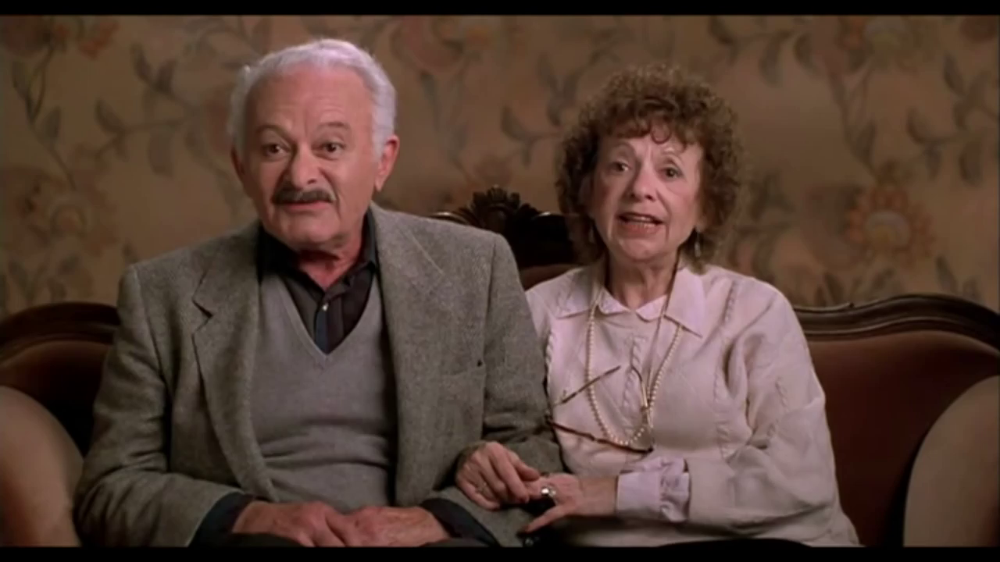

In [20]:
uf.show_frame_in_notebook(aframe)

## SHOW fixation points

   ### nota sul formato dati: 
     I dati sono coppie di cooordinate nel formato (x,y) . Quindi per usarli accedere al frame come F[y,x]. Nota per disegnare userò sempre (x,y)

In [1]:
VIDEO_ID = 1
if str(VIDEO_ID).zfill(3)+'.mp4' in os.listdir(os.path.join(RAW_VIDEO)):
    print('\n**************')
    print('VIDEO ID=>',VIDEO_ID)
    mat_data_fix_new,_ = uf.load_mat_data(os.path.join(FIX_DATA_NEW,f'{str(VIDEO_ID).zfill(3)}.mat'))
    fix_data = uf.get_fixation_points_per_obs_frame(fix_data=mat_data_fix_new, obs_id=0, frame_idx=0)
    frame_cnt = fix_data[2] if fix_data is not None else None 
    observer_cnt=fix_data[1] if fix_data is not None else None 
    print('frame count==>', frame_cnt, 'observer count==>', observer_cnt)
    """ 
    #stima max valore per coordinata per capire formato 
    max_fix_data_x = 0 
    max_fix_data_y=0
    for frame_id in range(frame_cnt):
        for obs_idx in range(observer_cnt):
            fix_data = get_fixation_points_per_obs_frame(fix_data=mat_data_fix_new, obs_id=obs_idx, frame_idx=frame_id)
            max_fix_data_x= fix_data[0][0] if fix_data[0][0]>max_fix_data_x else max_fix_data_x
            max_fix_data_y= fix_data[0][1] if fix_data[0][1]>max_fix_data_y else max_fix_data_y
            #print('fix_coordinates==>', fix_data[0])
    print('max fix x==>', max_fix_data_x, 'max fix y==>',max_fix_data_y)
    """
    frame_id=0 
    aframe=uf.read_specific_frame(video_path=os.path.join(RAW_VIDEO,str(VIDEO_ID).zfill(3)+'.mp4'),frame_idx=frame_id) 
    print('video frame shape==>',aframe.shape)
    if aframe is not None:
        #es frame shape (720, 1280, 3) =[altezza x larghezza x ch]
        height_f = aframe.shape[0] 
        width_f = aframe.shape[1] 
        for obs_idx in range(observer_cnt):
            fix_data = uf.get_fixation_points_per_obs_frame(fix_data=mat_data_fix_new, obs_id=obs_idx, frame_idx=frame_id)
            if fix_data: 
                
                x,y = fix_data[0]
                cv2.circle(aframe, (x, y), 2, (0, 255, 0), -1)

NameError: name 'os' is not defined

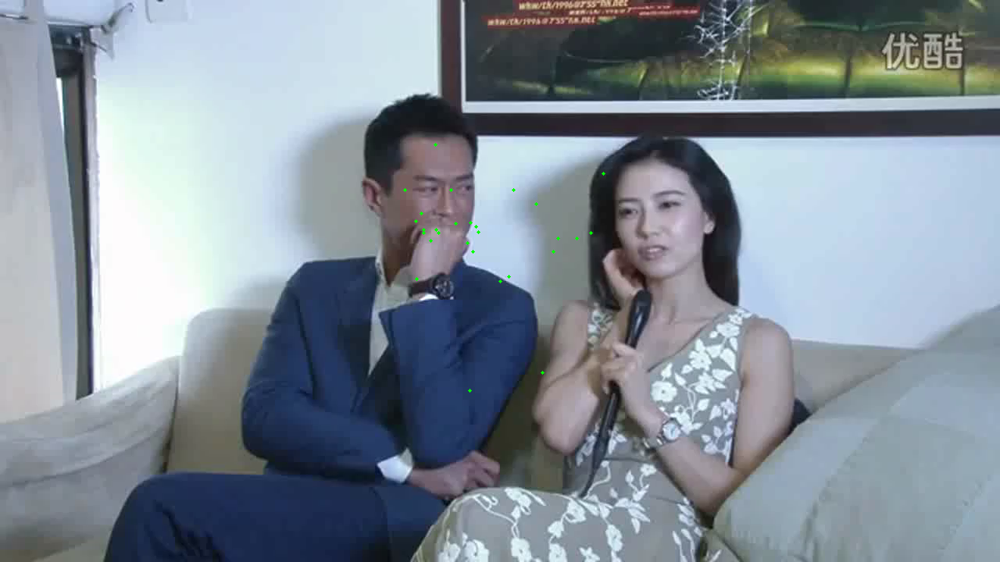

In [4]:
uf.show_frame_in_notebook(aframe)

In [10]:
print('ff')

ff


In [13]:
65*800*0.8

41600.0